# Snowmelt Runoff Onset Date Validation with Nooksack River (Streamgage at Glacier Creek)

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
from dask.distributed import Client
import py3dep
import geopandas as gpd
import rasterio as rio
import pystac
import pystac_client
import stackstac
import math
import shapely
import matplotlib.pyplot as plt
import os
import xarray as xr
from datetime import datetime
import ulmo
from datetime import datetime
import sys
import contextily as ctx
import rioxarray as rxr
from matplotlib_scalebar.scalebar import ScaleBar
import matplotlib
import matplotlib.transforms as mtransforms
import logging
import hydrofunctions as hf
sys.path.append('../sar_snowmelt_timing')
import s1_rtc_bs_utils
%matplotlib inline

In [2]:
#### CODE FOR DEVELOPMENT-- THIS RELOADS s1_rtc_bs_utils MODULE
sys.modules.pop('s1_rtc_bs_utils')
import s1_rtc_bs_utils

In [3]:
# GDAL environment variables for better performance
os.environ['AWS_REGION']='us-west-2'
os.environ['GDAL_DISABLE_READDIR_ON_OPEN']='EMPTY_DIR' 
os.environ['AWS_NO_SIGN_REQUEST']='YES' 
#
xr.set_options(keep_attrs=True)
# Paste /proxy/localhost:8787 for cluster diagnostics
client = Client(local_directory='/tmp', processes=False,silence_logs=logging.ERROR)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://172.25.45.79:8787/status,
Dashboard: http://172.25.45.79:8787/status,Workers: 1
Total threads: 32,Total memory: 125.71 GiB
Status: running,Using processes: False
Comm: inproc://172.25.45.79/458765/1,Workers: 1
Dashboard: http://172.25.45.79:8787/status,Total threads: 32
Started: Just now,Total memory: 125.71 GiB
Comm: inproc://172.25.45.79/458765/4,Total threads: 32
Dashboard: http://172.25.45.79:37781/status,Memory: 125.71 GiB
Nanny: None,


In [4]:
# comment out
fontsize=19

font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : fontsize}

matplotlib.rc('font', **font)

In [5]:
name = 'Mt. Baker (48.78N)'
geojson = '../input/shapefiles/mt_baker.geojson'     
collection = '../input/sentinel1-rtc-aws/mycollection_baker.json'        

In [6]:
# Let's look at 2020
start_date = '2020-01-01'
end_date = '2021-01-01'

In [ ]:
bbox_gdf = gpd.read_file(geojson)
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time=start_date,end_time=end_date,orbit_direction='all',polarization='gamma0_vv',collection=collection)
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

## Sentinel-1 Overpass Times

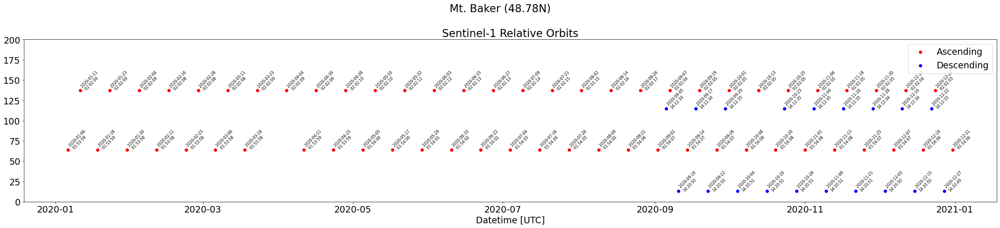

In [8]:
f,ax=plt.subplots(figsize=(30,7))
    
s1_rtc_bs_utils.plot_sentinel1_acquisitons(ts_ds,ax=ax)
f.suptitle(f'{name}')
plt.tight_layout()

## Sentinel-1 Backscatter Time Series (All orbits)

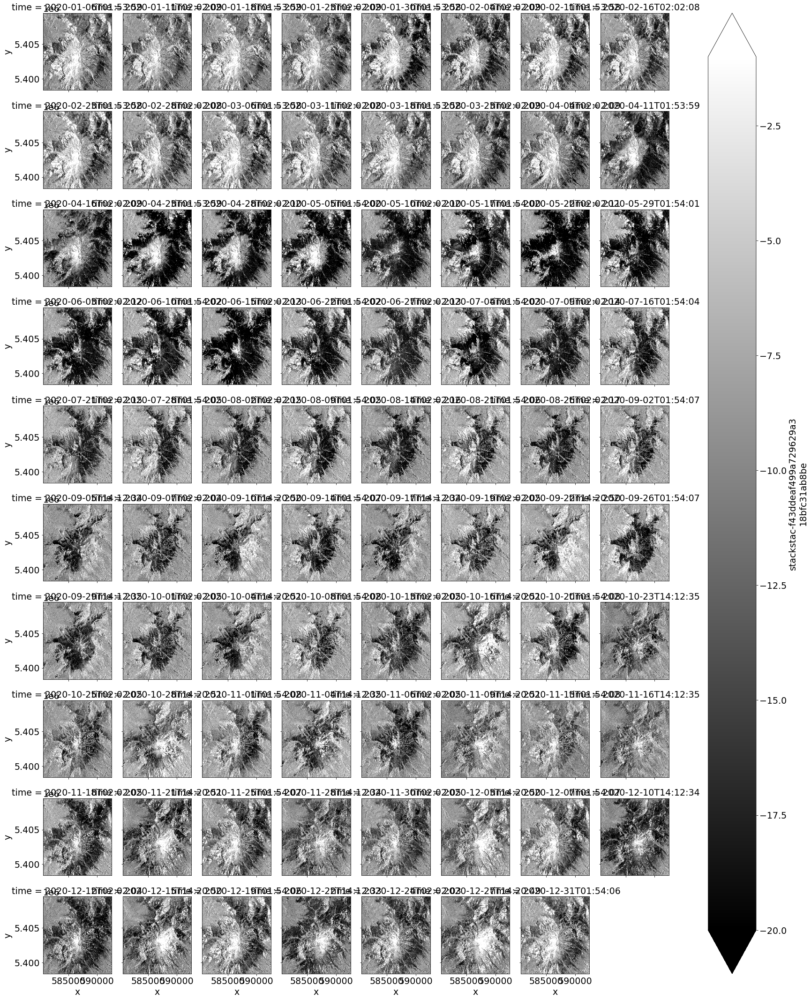

In [10]:
ts_ds_db = 10.0*np.log10(ts_ds)
ts_ds_db.plot(col='time',col_wrap=8,robust=False,cmap='gray',vmin=-20,vmax=-1)

## Combined S1 Backscatter, S2 NDSI, and SNOTEL Data

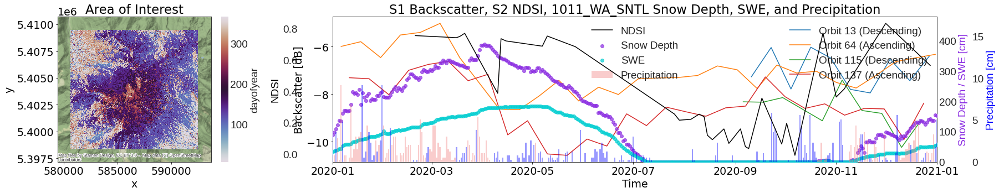

In [11]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(ts_ds,start_date=start_date,end_date=end_date)

## Let's look at the Runoff Onset Date Map

#### Let's also try a stricter NDVI < 0 threshold

In [12]:
#ts_ds[ts_ds['sat:relative_orbit']==137]
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time=start_date,end_time=end_date,orbit_direction='ascending',polarization='gamma0_vv',collection=collection)
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

In [13]:
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
ts_ds = ts_ds.where(summer_ndvi_ds.values<0)

In [14]:
runoff_onset_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear

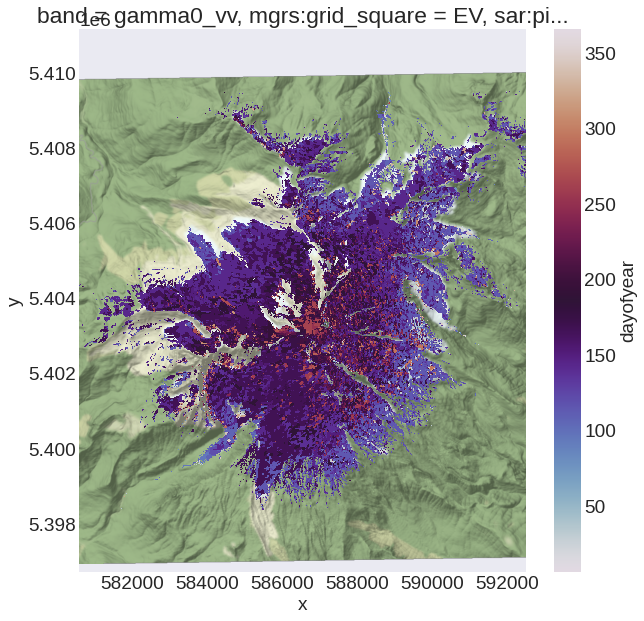

In [15]:
f,ax=plt.subplots(figsize=(10,10))
runoff_onset_map.plot(ax=ax,cmap='twilight')
ax.axis('equal')
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

## Let's bring in the streamgage data using hydrofunctions

In [16]:
#https://hydrofunctions.readthedocs.io/en/master/notebooks/Writing_Valid_Requests_for_NWIS.html
#test = hf.NWIS(bBox=[-122, 48.67, -121.7, 48.9])
#test

In [17]:
request = hf.NWIS('12205245', start_date=start_date,end_date=end_date)
glacier_creek_gage = request.df()

Requested data from https://waterservices.usgs.gov/nwis/dv/?format=json%2C1.1&sites=12205245&startDT=2020-01-01&endDT=2021-01-01


In [18]:
site_lat = request.meta['USGS:12205245']['siteLatLongSrs']['latitude']
site_lon = request.meta['USGS:12205245']['siteLatLongSrs']['longitude']
site_crs = request.meta['USGS:12205245']['siteLatLongSrs']['srs']
coords = pd.DataFrame({'longitude': [site_lon], 'latitude': [site_lat]})
site_location = gpd.points_from_xy(coords.longitude,coords.latitude,crs=site_crs)
site = gpd.GeoDataFrame(['Streamgage'],geometry=site_location)

## Let's bring in the watershed shapefile (thanks Eli Schwat)

In [19]:
baker_watersheds = gpd.read_file('../input/shapefiles/baker_watersheds.geojson').to_crs(ts_ds.crs)

Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)
Expecting property name enclosed in double quotes: line 1 column 2 (char 1)


In [20]:
glacier_creek = baker_watersheds[baker_watersheds.Name=='Glacier Creek']

## Let's see where the streamgage is in relation to the watershed

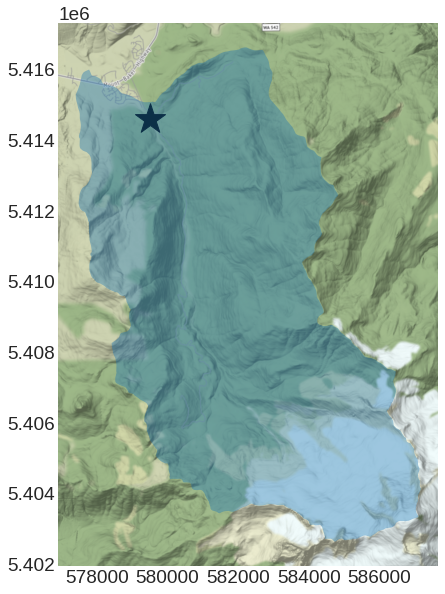

In [21]:
f,ax=plt.subplots(figsize=(10,10))
site.to_crs(ts_ds.rio.crs).plot(ax=ax,color='black',marker='*',markersize=1000)
baker_watersheds[baker_watersheds.Name=='Glacier Creek'].plot(ax=ax,alpha=0.4)
ctx.add_basemap(ax=ax, crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)

## Let's plot everything all together now

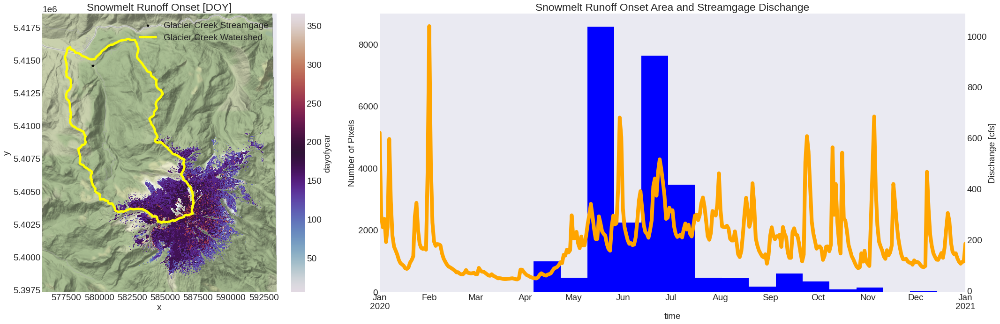

In [22]:
f,ax=plt.subplots(1,2,figsize=(30,10),gridspec_kw={'width_ratios': [1, 2]})


runoff_onset_map.plot(ax=ax[0],cmap='twilight')
ax[0].axis('equal')
site.to_crs(ts_ds.rio.crs).plot(ax=ax[0],color='black',marker='*',label='Glacier Creek Streamgage')
glacier_creek.geometry.boundary.plot(ax=ax[0],color='yellow',linewidth=5,label='Glacier Creek Watershed')
ax[0].legend()

ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax[0].set_title('Snowmelt Runoff Onset [DOY]')

ax_streamgage=ax[1].twinx()
s1_rtc_bs_utils.get_runoff_onset(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False)).plot.hist(ax=ax[1],color='blue',bins=20) # crop to watershed outline
glacier_creek_gage['USGS:12205245:00060:00003'].plot(ax=ax_streamgage,color='orange',linewidth=8)
ax[1].set_ylabel('Number of Pixels')
ax_streamgage.set_ylabel('Dischange [cfs]')
ax[1].set_title('Snowmelt Runoff Onset Area and Streamgage Dischange')

plt.tight_layout()

## Let's try over entire watershed

#### and with a more inclusive NDVI < 0.5 threshold

In [23]:
geojson = '../input/shapefiles/glacier_creek_watershed_bbox.geojson'     

In [24]:
bbox_gdf = gpd.read_file(geojson)
ts_ds = s1_rtc_bs_utils.get_s1_rtc_stac(bbox_gdf,start_time=start_date,end_time=end_date,orbit_direction='ascending',polarization='gamma0_vv',collection=collection)
ts_ds = ts_ds.compute()
ts_ds = ts_ds.dropna('time',how='all')

In [25]:
summer_ndvi_ds = s1_rtc_bs_utils.get_median_ndvi(ts_ds)
ts_ds = ts_ds.where(summer_ndvi_ds.values<1.0)

In [26]:
#ts_ds = ts_ds[ts_ds['sat:relative_orbit']==137]

In [27]:
runoff_onset_map = s1_rtc_bs_utils.get_runoff_onset(ts_ds).dt.dayofyear

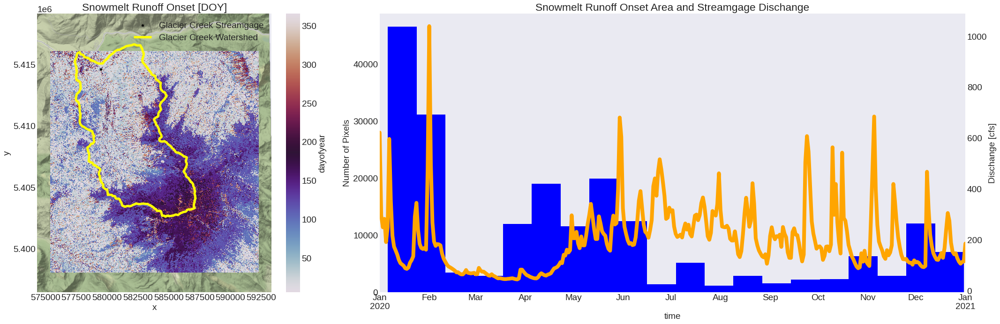

In [28]:
f,ax=plt.subplots(1,2,figsize=(30,10),gridspec_kw={'width_ratios': [1, 2]})


runoff_onset_map.plot(ax=ax[0],cmap='twilight')
ax[0].axis('equal')
site.to_crs(ts_ds.rio.crs).plot(ax=ax[0],color='black',marker='*',label='Glacier Creek Streamgage')
glacier_creek.geometry.boundary.plot(ax=ax[0],color='yellow',linewidth=5,label='Glacier Creek Watershed')
ax[0].legend()

ctx.add_basemap(ax=ax[0], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax[0].set_title('Snowmelt Runoff Onset [DOY]')

ax_streamgage=ax[1].twinx()
s1_rtc_bs_utils.get_runoff_onset(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False)).plot.hist(ax=ax[1],color='blue',bins=20) # crop to watershed outline
glacier_creek_gage['USGS:12205245:00060:00003'].plot(ax=ax_streamgage,color='orange',linewidth=8)
ax[1].set_ylabel('Number of Pixels')
ax_streamgage.set_ylabel('Dischange [cfs]')
ax[1].set_title('Snowmelt Runoff Onset Area and Streamgage Dischange')

plt.tight_layout()

## Let's look at SNOTEL data for meterological context

<AxesSubplot:title={'center':'SNOTEL Sites Around Study Site'}, xlabel='x', ylabel='y'>

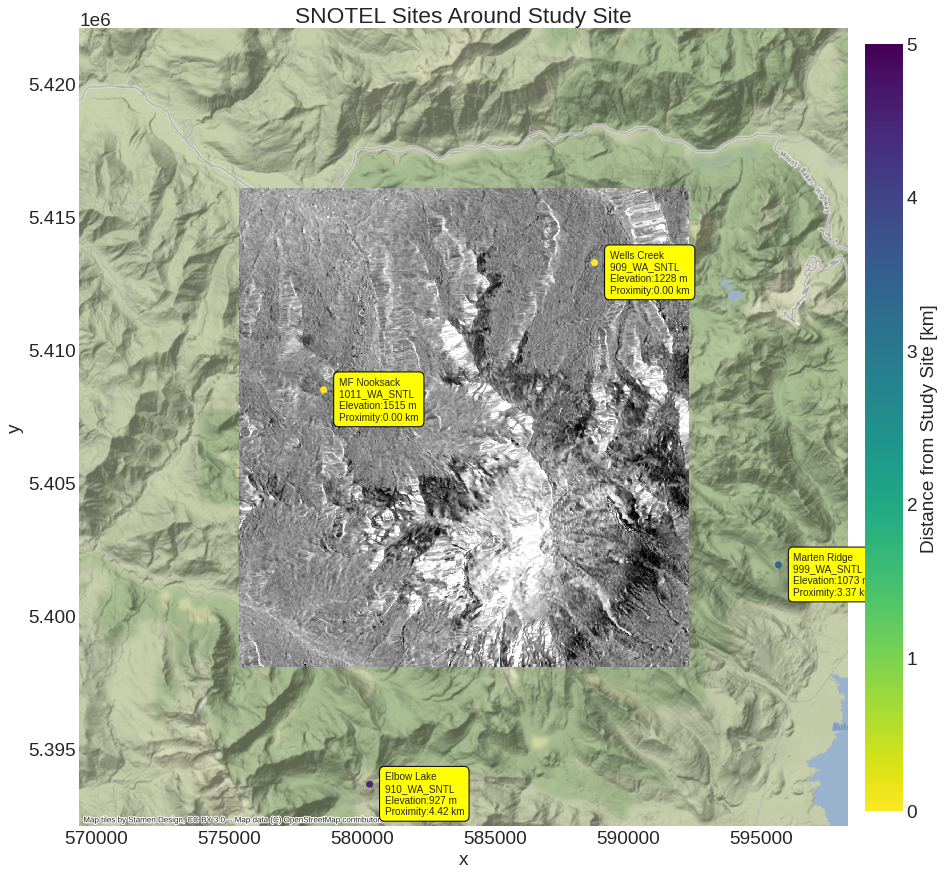

In [47]:
f,ax=plt.subplots(figsize=(15,15))
s1_rtc_bs_utils.plot_closest_snotel(ts_ds,ax=ax,distance_cutoff=5)

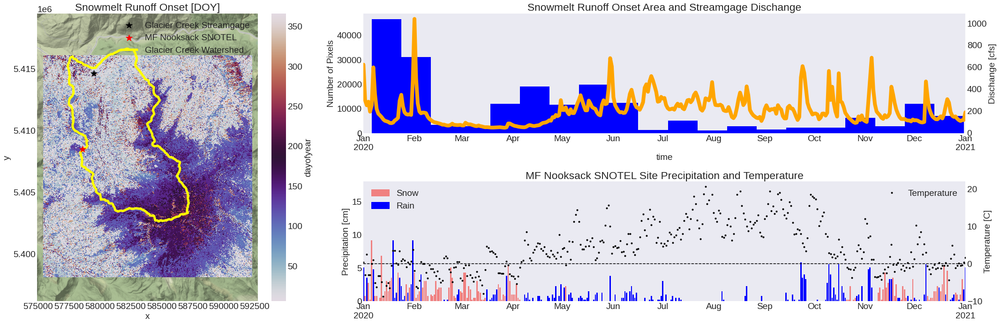

In [97]:
#f,ax=plt.subplots(1,2,figsize=(30,10),gridspec_kw={'width_ratios': [1, 2]})
f,ax=plt.subplot_mosaic("ABB;ACC",figsize=(30,10))

runoff_onset_map.plot(ax=ax['A'],cmap='twilight')
ax['A'].axis('equal')
site.to_crs(ts_ds.rio.crs).plot(ax=ax['A'],color='black',marker='*',markersize=200,label='Glacier Creek Streamgage')


sites_gdf = s1_rtc_bs_utils.find_closest_snotel(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False))
sites_gdf[sites_gdf['distance_km']==sites_gdf['distance_km'].min()].plot(ax=ax['A'],color='red',marker='*',markersize=200,label=f'{sites_gdf.name[0]} SNOTEL',zorder=2)

glacier_creek.geometry.boundary.plot(ax=ax['A'],color='yellow',linewidth=5,label='Glacier Creek Watershed',zorder=1)


ax['A'].legend(facecolor='white', frameon=True,framealpha=1,fontsize='small')


ax['A'].legend()

ctx.add_basemap(ax=ax['A'], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax['A'].set_title('Snowmelt Runoff Onset [DOY]')



ax_streamgage=ax['B'].twinx()
s1_rtc_bs_utils.get_runoff_onset(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False)).plot.hist(ax=ax['B'],color='blue',bins=20) # crop to watershed outline
glacier_creek_gage['USGS:12205245:00060:00003'].plot(ax=ax_streamgage,color='orange',linewidth=8)
ax['B'].set_ylabel('Number of Pixels')
ax_streamgage.set_ylabel('Dischange [cfs]')
ax['B'].set_title('Snowmelt Runoff Onset Area and Streamgage Dischange')

snotel_precip = s1_rtc_bs_utils.get_closest_snotel_data(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False),variable_code='SNOTEL:PRCPSA_D',distance_cutoff=30,closest=True, start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
snotel_temp = s1_rtc_bs_utils.get_closest_snotel_data(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False),variable_code='SNOTEL:TAVG_D',distance_cutoff=30,closest=True, start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
snotel_temp=(snotel_temp-32)/1.8
temp_precip_gdf = pd.concat([snotel_temp,snotel_precip],axis=1,join='inner')
temp_precip_gdf.set_axis(['Temperature','Precip'],axis=1,inplace=True)
conditions = [(temp_precip_gdf['Temperature'] <=0),(temp_precip_gdf['Temperature'] > 0)]
values = ['lightcoral', 'blue']
temp_precip_gdf['bar_color'] = np.select(conditions, values)
    
    
precip_plot = ax['C'].bar(temp_precip_gdf.index,2.54*temp_precip_gdf.iloc[:,1],color=temp_precip_gdf['bar_color'],alpha=1,label='Precipitation')
ax['C'].set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])   
ax['C'].set_ylim([0,18])
ax['C'].set_title(f'{sites_gdf.name[0]} SNOTEL Site Precipitation and Temperature')
ax['C'].set_ylabel('Precipitation [cm]')
#ax['C'].legend()
colors = {'Snow':'lightcoral', 'Rain':'blue'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
ax['C'].legend(handles, labels, loc='upper left')

ax_temp = ax['C'].twinx()
snotel_temp.plot(ax=ax_temp,label='Temperature',color='black',linewidth=0,marker='.')
ax_temp.set_ylabel('Temperature [C]')
ax_temp.set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])   
ax_temp.set_ylim([-10,22])
ax_temp.legend(['Temperature'],loc='upper right')

ax_temp.hlines(y=0,xmin=datetime.strptime(start_date,'%Y-%m-%d'),xmax=datetime.strptime(end_date,'%Y-%m-%d'),color='black',linestyle='--')

plt.tight_layout()

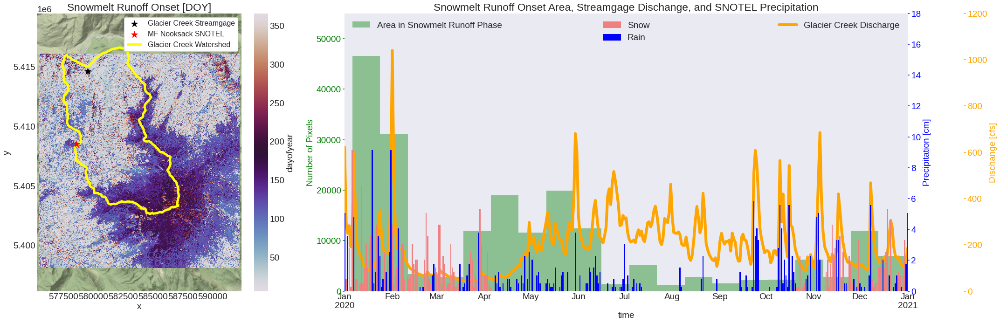

In [98]:
#f,ax=plt.subplots(1,2,figsize=(30,10),gridspec_kw={'width_ratios': [1, 2]})
f,ax=plt.subplot_mosaic("ABB;ABB",figsize=(30,10))

runoff_onset_map.plot(ax=ax['A'],cmap='twilight')
ax['A'].axis('equal')
site.to_crs(ts_ds.rio.crs).plot(ax=ax['A'],color='black',marker='*',markersize=200,label='Glacier Creek Streamgage')


sites_gdf = s1_rtc_bs_utils.find_closest_snotel(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False))
sites_gdf[sites_gdf['distance_km']==sites_gdf['distance_km'].min()].plot(ax=ax['A'],color='red',marker='*',markersize=200,label=f'{sites_gdf.name[0]} SNOTEL',zorder=2)

glacier_creek.geometry.boundary.plot(ax=ax['A'],color='yellow',linewidth=5,label='Glacier Creek Watershed',zorder=1)


ax['A'].legend(facecolor='white', frameon=True,framealpha=1,fontsize='small')


ctx.add_basemap(ax=ax['A'], crs=ts_ds.rio.crs, source=ctx.providers.Stamen.Terrain, attribution=False)
ax['A'].set_title('Snowmelt Runoff Onset [DOY]')


ax_streamgage=ax['B'].twinx()
ax_streamgage.spines.right.set_position(("axes", 1.1))

s1_rtc_bs_utils.get_runoff_onset(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False)).plot.hist(ax=ax['B'],color='green',bins=20,alpha=0.4,label='Area in Snowmelt Runoff Phase') # crop to watershed outline
ax['B'].legend(loc='upper left')
glacier_creek_gage['USGS:12205245:00060:00003'].plot(ax=ax_streamgage,color='orange',linewidth=6, label='Glacier Creek Discharge')
ax['B'].set_ylabel('Number of Pixels')
ax_streamgage.set_ylabel('Dischange [cfs]')
ax_streamgage.legend(loc='upper right')
#ax['B'].set_title('Snowmelt Runoff Onset Area and Streamgage Dischange')

snotel_precip = s1_rtc_bs_utils.get_closest_snotel_data(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False),variable_code='SNOTEL:PRCPSA_D',distance_cutoff=30,closest=True, start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
snotel_temp = s1_rtc_bs_utils.get_closest_snotel_data(ts_ds.rio.clip(glacier_creek.geometry,glacier_creek.crs,drop=True,invert=False),variable_code='SNOTEL:TAVG_D',distance_cutoff=30,closest=True, start_date='1900-01-01', end_date=datetime.today().strftime('%Y-%m-%d'))
snotel_temp=(snotel_temp-32)/1.8
temp_precip_gdf = pd.concat([snotel_temp,snotel_precip],axis=1,join='inner')
temp_precip_gdf.set_axis(['Temperature','Precip'],axis=1,inplace=True)
conditions = [(temp_precip_gdf['Temperature'] <=0),(temp_precip_gdf['Temperature'] > 0)]
values = ['lightcoral', 'blue']
temp_precip_gdf['bar_color'] = np.select(conditions, values)
    
    
ax_precip = ax['B'].twinx()
precip_plot = ax_precip.bar(temp_precip_gdf.index,2.54*temp_precip_gdf.iloc[:,1],color=temp_precip_gdf['bar_color'],alpha=1,label='Precipitation')
ax_precip.set_xlim([datetime.strptime(start_date,'%Y-%m-%d'),datetime.strptime(end_date,'%Y-%m-%d')])   
ax_precip.set_ylim([0,18])
#ax_precip.set_title(f'{sites_gdf.name[0]} SNOTEL Site Precipitation and Temperature')
ax_precip.set_ylabel('Precipitation [cm]')
#ax['C'].legend()
colors = {'Snow':'lightcoral', 'Rain':'blue'}         
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
ax_precip.legend(handles, labels, loc='upper center')


tkw = dict(size=4, width=1.5)

ax['B'].yaxis.label.set_color('green')
ax['B'].tick_params(axis='y', colors='green', **tkw)


ax_streamgage.yaxis.label.set_color('orange')
ax_streamgage.tick_params(axis='y', colors='orange', **tkw)

ax_precip.yaxis.label.set_color('blue')
ax_precip.tick_params(axis='y', colors='blue', **tkw)

ax_streamgage.set_ylim([0,1200])
ax['B'].set_ylim([0,55000])

ax['B'].set_title('Snowmelt Runoff Onset Area, Streamgage Dischange, and SNOTEL Precipitation')

plt.tight_layout()

## And one more look at meterological context

In [ ]:
s1_rtc_bs_utils.plot_bs_ndsi_swe_precip_with_context(ts_ds,start_date='2020-01-01',end_date='2021-01-01')

In [ ]:
rgb = s1_rtc_bs_utils.get_s2_rgb(ts_ds,cloud_cover_threshold=80)
new_rgb = np.clip(rgb/np.amax(rgb),0,1)

In [ ]:
new_rgb.plot.imshow(col='time',col_wrap=5,rgb='band',robust=True)